In [1]:
import scanpy as sc
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

sc.set_figure_params(figsize=(7,7), format='pdf')
sc.settings.figdir = '../plots/umaps/'

import warnings
warnings.filterwarnings('ignore')

In [2]:
adata = sc.read_h5ad('./../data/Inte_CellCycle_SeuScore_Seurat_annotated.DS.h5ad', backed=False)

adata.obs['Phase'] = adata.obs['Phase'].astype('category').cat.reorder_categories(['G1', 'S', 'G2M'])
adata.uns['Phase_colors'] = ['#FFD700','#5F9EA0','#EE82EE']

cts = ['FGF17-like','Mes prog','RG early','RG late', 'Neral crest/Mes', 'Neuron', 'High-mito']
palette = dict(zip(cts, ['#F0E442', '#009E73', '#E69F00', '#D55E00', '#56B4E9', '#0072B2', '#CC79A7']))

adata.obs['anno_cluster'] = adata.obs['anno_cluster'].astype('category').cat.reorder_categories(cts)
adata.uns['anno_cluster_colors'] = [palette[ct] for ct in cts]

adata.obs['origin_sex'] = adata.obs['origin_sex'].astype(str).replace({'1':'Male', '0':'Female'}).astype('category').cat.reorder_categories(['Female', 'Male'])
adata.uns['origin_sex_colors'] = ['#FFD700', '#5F9EA0']

adata.obs['cell_origin'] = adata.obs['cell_origin'].astype('category').cat.reorder_categories(
    ['D8_ASD_375','D8_ASD_384','D8_ASD_494','D8_Ctrl_290','D8_Ctrl_311','D8_Ctrl_317'])
adata.uns['cell_origin_colors'] = ['#B2182B','#EF8A62','#FDDBC7','#2166AC','#67A9CF','#D1E5F0']



In [3]:
c_cols = []
for c in adata.obs['anno_cluster'].cat.categories:
    ccol = f'is {c}'
    adata.obs[ccol] = np.where(adata.obs['anno_cluster'] == c, c, '')
    adata.obs[ccol] = adata.obs[ccol].astype('category').cat.reorder_categories([c, ''])
    adata.uns[f'{ccol}_colors'] = ['#FF0000DD', '#11111111']
    c_cols.append(ccol)
    
phase_cols = []
for c in adata.obs['Phase'].cat.categories:
    ccol = f'is {c}'
    adata.obs[ccol] = np.where(adata.obs['Phase'] == c, c, '')
    adata.obs[ccol] = adata.obs[ccol].astype('category').cat.reorder_categories([c, ''])
    adata.uns[f'{ccol}_colors'] = ['#FF2222DD', '#11111111']
    phase_cols.append(ccol)
    
donor_cols = []
for c in adata.obs['cell_origin'].unique():
    ccol = f'is {c}'
    adata.obs[ccol] = np.where(adata.obs['cell_origin'] == c, c, '')
    adata.obs[ccol] = adata.obs[ccol].astype('category').cat.reorder_categories([c, ''])
    adata.uns[f'{ccol}_colors'] = ['#FF0000DD', '#11111111']
    donor_cols.append(ccol)
    
sex_cols = []
for c in adata.obs['origin_sex'].cat.categories:
    ccol = f'is {c}'
    adata.obs[ccol] = np.where(adata.obs['origin_sex'] == c, c, '')
    adata.obs[ccol] = adata.obs[ccol].astype('category').cat.reorder_categories([c, ''])
    adata.uns[f'{ccol}_colors'] = ['#FF2222DD', '#11111111']
    sex_cols.append(ccol)
    
cond_cols = []
for c in adata.obs['condition'].unique():
    ccol = f'is {c}'
    adata.obs[ccol] = np.where(adata.obs['condition'] == c, c, '')
    adata.obs[ccol] = adata.obs[ccol].astype('category').cat.reorder_categories([c, ''])
    adata.uns[f'{ccol}_colors'] = ['#FF0000DD', '#11111111']
    cond_cols.append(ccol)

In [4]:
a = adata[adata.obs['anno_cluster']!='High-mito',:]
a.obsm['original'] = a.obsm['X_umap'].copy()
a.obsm['new'] = pd.read_csv('../data/DE_DS.NoHighMito.pp.umap.csv', index_col=0, usecols=[0,1,2]).loc[a.obs_names,:].values
a.obsm['X_new'] = a.obsm['new'] 

### All genes

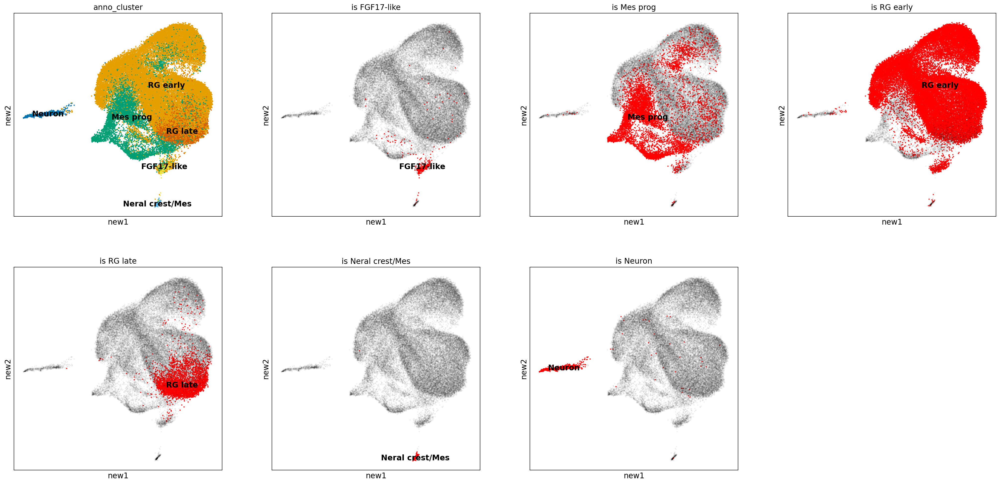

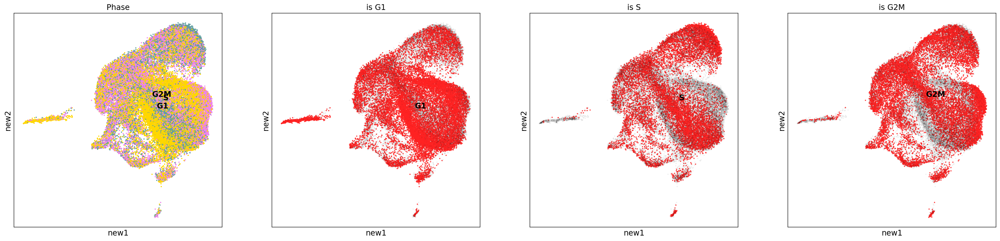

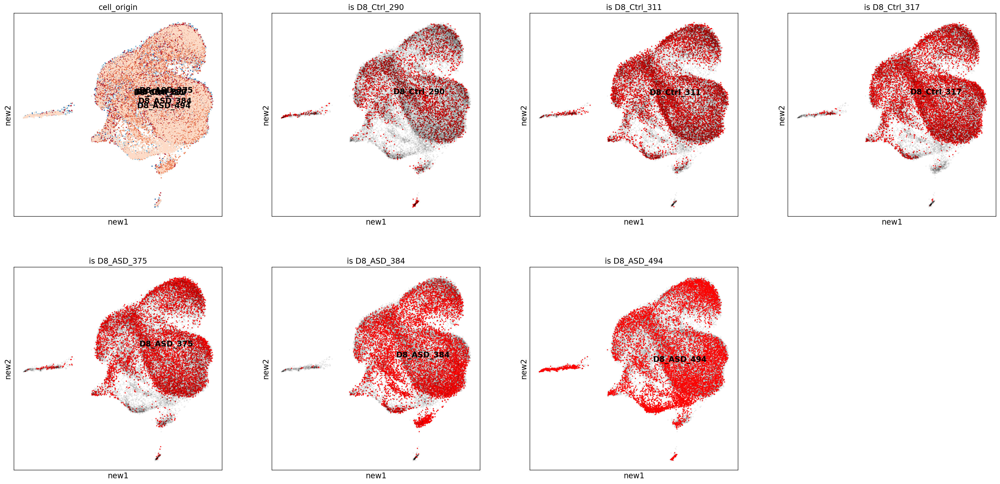

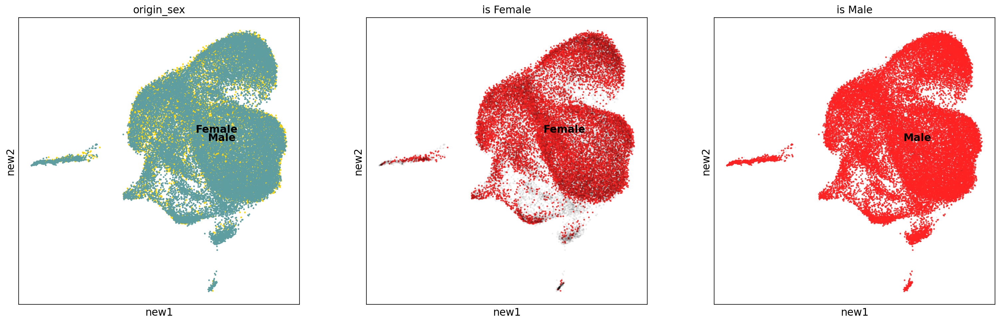

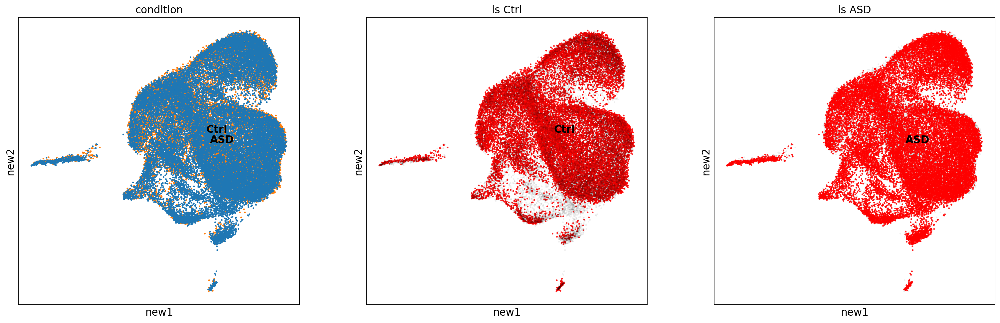

In [5]:
sc.pl.embedding(a, color=['anno_cluster']+c_cols[:-1], basis='new', size=20, sort_order=True, add_outline=False, legend_loc='on data', save='_anno_cluster.pdf')
sc.pl.embedding(a, color=['Phase']+phase_cols, basis='new', size=20, sort_order=True, add_outline=False, legend_loc='on data', save='_Phase.pdf')
sc.pl.embedding(a, color=['cell_origin']+donor_cols, basis='new', size=20, sort_order=True, add_outline=False, legend_loc='on data', save='_cell_origin.pdf')
sc.pl.embedding(a, color=['origin_sex']+sex_cols, basis='new', size=20, sort_order=True, add_outline=False, legend_loc='on data', save='_origin_sex.pdf')
sc.pl.embedding(a, color=['condition']+cond_cols, basis='new', size=20, sort_order=True, add_outline=False, legend_loc='on data', save='_condition.pdf')


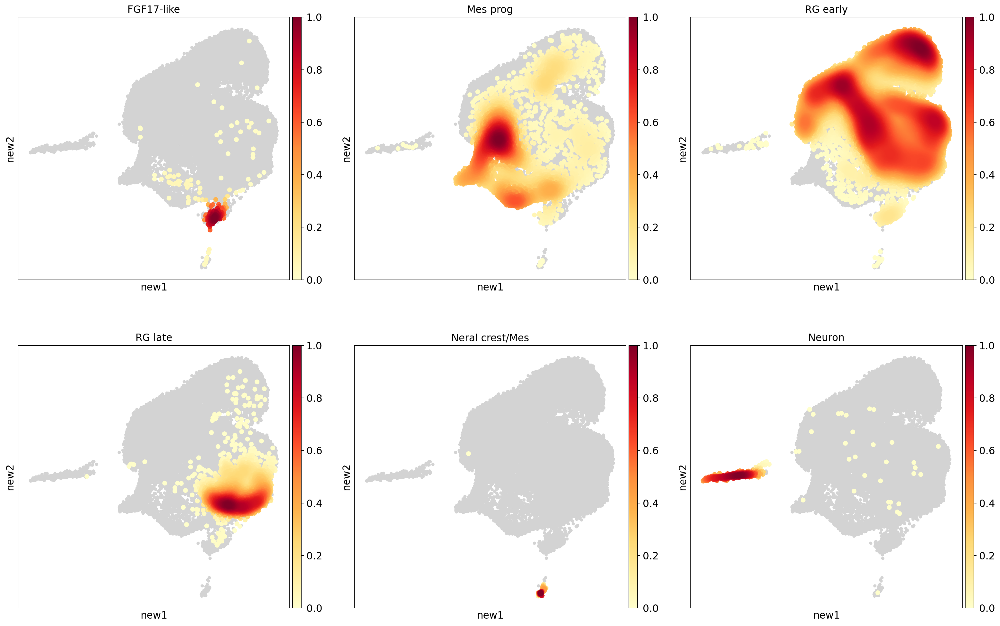

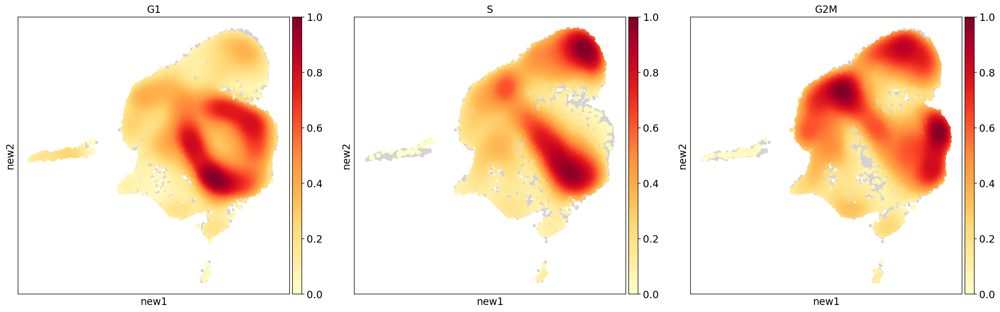

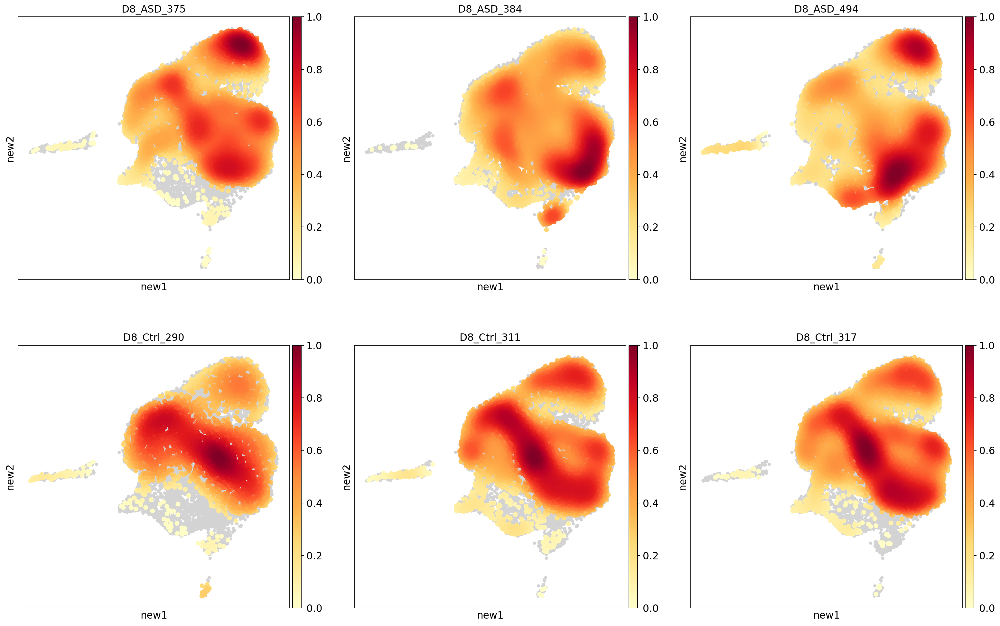

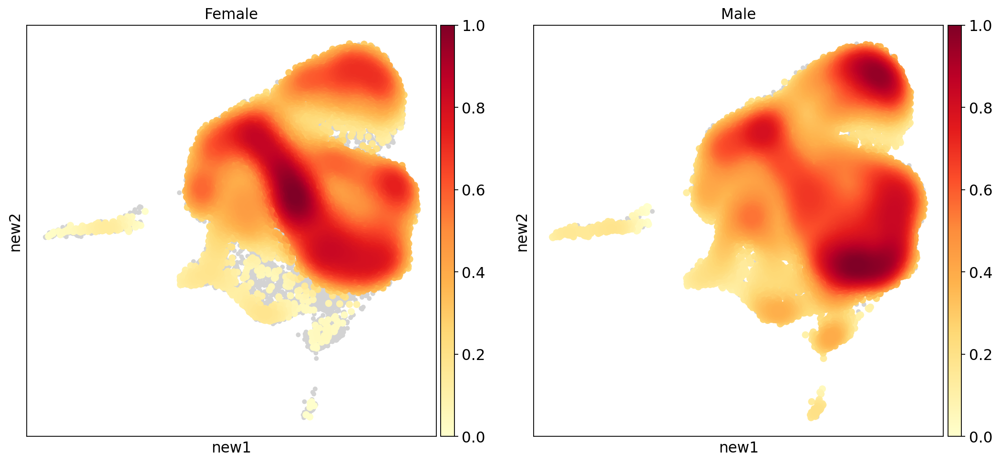

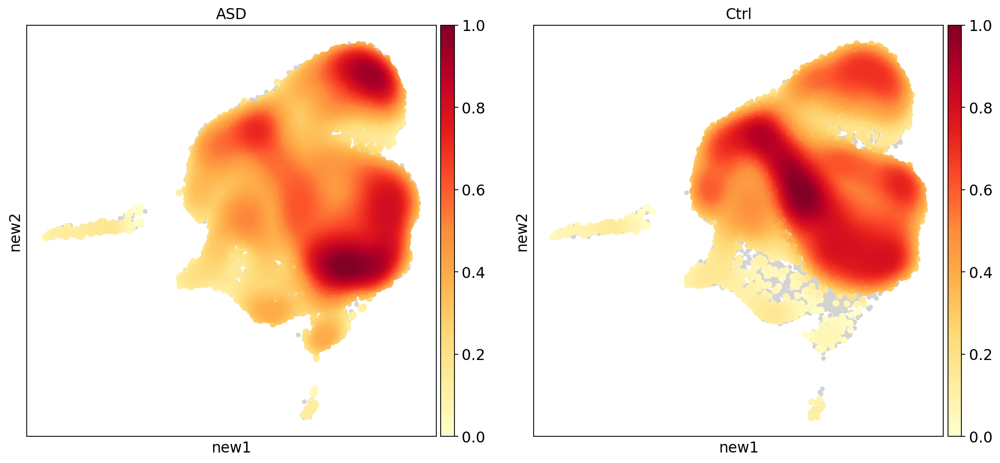

In [6]:
sc.tl.embedding_density(adata=a, basis='new', groupby='anno_cluster')
sc.pl.embedding_density(adata=a, basis='new', key='new_density_anno_cluster', ncols=3, save='no_hm-new.pdf')
sc.tl.embedding_density(adata=a, basis='new', groupby='Phase')
sc.pl.embedding_density(adata=a, basis='new', key='new_density_Phase', ncols=3, save='no_hm-new.pdf')
sc.tl.embedding_density(adata=a, basis='new', groupby='cell_origin')
sc.pl.embedding_density(adata=a, basis='new', key='new_density_cell_origin', ncols=3, save='no_hm-new.pdf')
sc.tl.embedding_density(adata=a, basis='new', groupby='origin_sex')
sc.pl.embedding_density(adata=a, basis='new', key='new_density_origin_sex', ncols=3, save='no_hm-new.pdf')
sc.tl.embedding_density(adata=a, basis='new', groupby='condition')
sc.pl.embedding_density(adata=a, basis='new', key='new_density_condition', ncols=3, save='no_hm-new.pdf')